In [2]:
# Install the Pillow library, which provides image processing capabilities
!pip install Pillow

# Import necessary libraries and modules
import os                         # Provides functions to interact with the operating system
import torch                      # Main PyTorch library for tensor operations and neural networks
from torch import nn, optim       # Import neural network and optimizer classes
from torchvision import datasets, transforms  # Datasets for training and transformations for data preprocessing
import torch.nn.functional as F   # Functional interface containing methods like activation functions
from torch.utils.data import DataLoader        # DataLoader to handle batches of data
from torchvision.models import inception_v3    # Pretrained InceptionV3 model for transfer learning or evaluation
from torchvision.utils import save_image, make_grid  # Utilities to save images and make image grids
from torchinfo import summary     # Provides a summary of models similar to model.summary() in Keras
from tqdm import tqdm             # Provides a progress bar for loops
from math import log2             # Logarithm base 2 function for mathematical operations
import scipy                      # Library for scientific computing and technical computing
from scipy.stats import truncnorm # Truncated normal distribution for generating random numbers
import numpy as np                # Fundamental package for scientific computing with Python
import pandas as pd               # Data manipulation and analysis library
from torch.distributions import MultivariateNormal  # Multivariate normal distribution for generating samples
import seaborn as sns             # Statistical data visualization library
import matplotlib.pyplot as plt   # Plotting library
from zipfile import ZipFile       # Handles ZIP files
from PIL import Image             # Provides image manipulation capabilities
import matplotlib.animation as animation  # Support for creating animations using Matplotlib
from IPython.display import HTML  # Display HTML in Jupyter notebooks
import re                         # Provides regular expression matching operations
import warnings                   # Allows for the suppression and display of warnings

In [3]:
def seed_everything(seed=42):
    """
    Sets seed for reproducibility across multiple function calls.

    This function ensures that all random number generation across
    various libraries and frameworks (os, numpy, PyTorch) is deterministic,
    which helps in replicating the results across different runs.

    Parameters:
    seed (int): The seed value to use for all random number generators.

    Returns:
    None
    """
    # Set the PYTHONHASHSEED environment variable to a fixed value
    # This is used by the Python hash function for strings and data structures like dictionaries
    os.environ['PYTHONHASHSEED'] = str(seed)
    
    # Set the seed for numpy's random number generator,
    # which is used in various numpy operations and used by libraries relying on numpy
    np.random.seed(seed)
    
    # Set the seed for PyTorch random number generation for CPU operations
    torch.manual_seed(seed)
    
    # Set the seed for PyTorch random number generation for CUDA (GPU) operations
    torch.cuda.manual_seed(seed)
    
    # Ensure that CUDA operations are the same across multiple invocations, even if it reduces performance
    torch.cuda.manual_seed_all(seed)  # For multi-GPU setups, this seeds all GPUs
    
    # Forces PyTorch to use the same convolution algorithm every time an application is run
    torch.backends.cudnn.deterministic = True
    
    # Disables the inbuilt cuDNN auto-tuner that finds the optimal set of algorithms for network configurations
    # This is turned off to ensure reproducibility, but might increase the time taken to find optimal configurations
    torch.backends.cudnn.benchmark = False
    
# Call the function to set seeds for reproducibility
seed_everything()

In [4]:
# Set the path to the dataset. This specifies the location where the training data is stored.
# Here, it points to a dataset directory typically found in Kaggle environments.
DATASET = "/kaggle/input/pytorch-challange-flower-dataset"

# This defines the starting image size for progressive growing of the model. Progressive training
# begins at this resolution. The size is specified in pixels (8x8 in this case).
START_TRAIN_AT_IMG_SIZE = 8

# Sets the device where the model will be trained. Uses GPU if available; otherwise, it falls back to CPU.
# This is crucial for training efficiency as GPUs provide significantly faster computation for deep learning tasks.
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Defines the learning rate for the optimizer. This is a crucial hyperparameter that affects how
# quickly the model learns. A learning rate that is too high can cause the model to converge too
# quickly to a suboptimal solution, and too low can slow down the learning process.
LEARNING_RATE = 1e-3

# A list specifying the batch sizes to use at each stage of the training. The batch size determines
# how many samples the network sees before updating the model parameters. Typically, this might start
# higher and reduce as the resolution increases to manage GPU memory usage effectively.
BATCH_SIZES = [256, 128, 64, 32, 16, 8, 4]

# Specifies the number of channels in the input images. For RGB images, this is 3.
CHANNELS_IMG = 3

# Dimensionality of the latent space (Z-dimension). This is a hyperparameter for GANs where
# Z-dimension vectors are input to the generator.
Z_DIM = 256

# Dimensionality of the intermediate latent space (W-dimension). This is often used in styles-based
# GAN architectures like StyleGAN, where the mapping network maps Z to a disentangled latent space W.
W_DIM = 256

# Specifies the number of input channels to the generator. This often matches the channels of
# intermediate feature maps.
IN_CHANNELS = 256

# The lambda value used for gradient penalty in training to stabilize the training process.
# This helps in enforcing the Lipschitz constraint by penalizing the gradient's norm deviation from 1.
LAMBDA_GP = 10

# Specifies the number of epochs to train at each resolution stage. Here, 30 epochs are used
# for each progressive stage, as indicated by the length of BATCH_SIZES.
PROGRESSIVE_EPOCHS = [30] * len(BATCH_SIZES)

In [5]:
def get_loader(image_size):
    """
    Create a DataLoader to handle image loading and preprocessing at a specified image size.
    
    Args:
        image_size (int): The size to which the images will be resized, in pixels.
    
    Returns:
        tuple: A DataLoader object for loading the dataset and the dataset object itself.
    """

    # Define transformations for preprocessing the images:
    # 1. Resize: Changes the size of each image to the specified image_size for uniformity.
    # 2. ToTensor: Converts the images to PyTorch tensors.
    # 3. RandomHorizontalFlip: Augments the dataset by flipping images horizontally with a 50% probability,
    #    which helps in reducing overfitting and makes the model robust to orientation changes.
    # 4. Normalize: Normalizes the tensor images by setting their mean and standard deviation to 0.5 for each channel.
    #    This is typically done to ensure the model trains faster and reduces the chance of getting stuck in local optima.
    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.Normalize(
                [0.5 for _ in range(CHANNELS_IMG)],  # Mean for each channel
                [0.5 for _ in range(CHANNELS_IMG)]   # Std deviation for each channel
            ),
        ]
    )
    
    # Determine the batch size from the BATCH_SIZES list based on the current image size.
    # The index for BATCH_SIZES is calculated by taking the logarithm base 2 of the ratio
    # of image_size to 4 (the starting size), effectively scaling the batch size down
    # as the image resolution increases.
    batch_size = BATCH_SIZES[int(log2(image_size / 4))]
    
    # Load the dataset from the specified directory (DATASET), applying the transformations defined above.
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    
    # Create a DataLoader object to manage batches from the dataset, with shuffling enabled
    # to ensure that batches are not biased and the model does not memorize the order of images.
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True
    )
    
    # Return the DataLoader and the dataset objects for use in training.
    return loader, dataset

In [6]:
# Define a list of factors for scaling operations. These are typically used to adjust the size or resolution
# of elements in a progressive manner. Each element in the list represents a scaling factor where:
# - The first four elements ('1') indicate no scaling, maintaining the original size or proportion.
# - Subsequent elements represent fractional scaling, reducing size progressively by powers of 2:
#   - 1/2 reduces the size by half,
#   - 1/4 reduces to a quarter of the original size,
#   - 1/8 reduces to one eighth, and so forth.
# This setup is commonly used in applications such as progressive image generation or multi-resolution analysis,
# where operations start at full scale and progressively work on smaller scales to either improve performance,
# manage computational resources, or refine details at different resolutions.
factors = [1, 1, 1, 1, 1/2, 1/4, 1/8, 1/16, 1/32]

In [7]:
class WSLinear(nn.Module):
    """
    A weight-scaled linear (fully connected) layer, as used in StyleGAN and similar architectures.
    This layer scales the weights by the square root of 2 divided by the number of input features,
    aiming to stabilize the training process by normalizing the variance of the layer's inputs.
    """

    def __init__(self, in_features, out_features):
        """
        Initializes the WSLinear layer.

        Args:
            in_features (int): Number of input features.
            out_features (int): Number of output features.
        """
        super(WSLinear, self).__init__()
        # Define the linear layer without a bias because bias will be manually added after scaling
        self.linear = nn.Linear(in_features, out_features, bias=False)
        
        # Calculate the scaling factor, which is used to normalize the weights' scale
        self.scale = (2 / in_features) ** 0.5
        
        # Save the original bias from the linear layer and set the linear layer's bias to None
        self.bias = nn.Parameter(torch.zeros(out_features))
        
        # Initialize the weights from a normal distribution and biases to zero
        nn.init.normal_(self.linear.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        """
        Forward pass of the WSLinear layer.

        Args:
            x (torch.Tensor): Input tensor.

        Returns:
            torch.Tensor: Output tensor after applying the scaled linear transformation and adding bias.
        """
        # Apply the linear transformation scaled by the calculated factor and add the bias
        return self.linear(x * self.scale) + self.bias

In [8]:
class MappingNetwork(nn.Module):
    """
    Mapping Network for transforming the input latent space vector z to an intermediate
    latent space w. Commonly used in generative models like StyleGAN, this network helps
    in controlling the style aspects of the generated images through a learned affine transformation.

    The network consists of multiple fully connected layers with ReLU activations, aimed
    at producing a more disentangled representation of the latent space.
    """

    def __init__(self, z_dim, w_dim):
        """
        Initializes the Mapping Network with several layers of transformations.

        Args:
            z_dim (int): Dimensionality of the input latent vector z.
            w_dim (int): Dimensionality of the output latent vector w.
        """
        super().__init__()  # Initialize the superclass nn.Module

        # Define the mapping layers:
        # PixelNorm is applied to normalize the inputs to the mapping layers,
        # followed by several layers of WSLinear (weight-scaled linear layers)
        # interleaved with ReLU activations for non-linearity.
        self.mapping = nn.Sequential(
            PixelNorm(),  # Normalize the incoming latent vector
            WSLinear(z_dim, w_dim),  # First transformation from z-dim to w-dim
            nn.ReLU(),  # Non-linear activation function
            WSLinear(w_dim, w_dim),  # Further transformation within the w-dim space
            nn.ReLU(),  # Repeat application of ReLU and WSLinear to enhance transformation
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim)  # Final transformation to refine the w vector
        )

    def forward(self, x):
        """
        Defines the forward pass of the Mapping Network.

        Args:
            x (torch.Tensor): The input latent vector z.

        Returns:
            torch.Tensor: The transformed latent vector w.
        """
        # Pass the input x through the mapping layers to obtain w
        return self.mapping(x)

In [9]:
class AdaIN(nn.Module):
    """
    Adaptive Instance Normalization (AdaIN) layer used in style-based generator architectures.
    This layer adjusts the feature maps of the generator by modulating them with style parameters
    derived from the latent vector w. It normalizes each feature map separately to have zero mean and unit variance,
    and then scales and shifts them using learned parameters.

    AdaIN is key in transferring style information from the latent space to the generated images,
    enabling fine control over style features in generative models.
    """

    def __init__(self, channels, w_dim):
        """
        Initializes the AdaIN layer.

        Args:
            channels (int): Number of feature channels in the input feature maps.
            w_dim (int): Dimensionality of the latent vector w, from which style parameters are derived.
        """
        super().__init__()
        # Instance normalization is applied per channel and per instance (individual feature map in a batch)
        self.instance_norm = nn.InstanceNorm2d(channels, affine=False)

        # Two fully connected layers to learn scaling and biasing parameters from the latent vector w.
        # These parameters are used to modulate the feature maps after normalization.
        self.style_scale = WSLinear(w_dim, channels)  # Learns scale parameters
        self.style_bias = WSLinear(w_dim, channels)   # Learns bias parameters

    def forward(self, x, w):
        """
        Forward pass of the AdaIN layer.

        Args:
            x (torch.Tensor): Input tensor of feature maps from the previous layer.
            w (torch.Tensor): Latent vector used to generate style parameters.

        Returns:
            torch.Tensor: The style-modulated feature maps.
        """
        # Normalize the input feature maps to have zero mean and unit variance
        x = self.instance_norm(x)

        # Generate scale and bias parameters from the latent vector w
        # Unsqueeze operations adjust tensor dimensions to allow for broadcasting
        style_scale = self.style_scale(w).unsqueeze(2).unsqueeze(3)  # Add two dimensions for height and width
        style_bias = self.style_bias(w).unsqueeze(2).unsqueeze(3)    # Same as above

        # Apply the AdaIN transformation: scale the normalized feature maps and then add bias
        return style_scale * x + style_bias

In [10]:
class InjectNoise(nn.Module):
    """
    InjectNoise is a module that adds randomly generated noise to each feature map independently.
    This approach is used in GAN architectures to introduce additional stochastic variation, 
    helping to enhance the realism and detail in the generated images, especially textures.

    The noise is scaled by a learned per-channel parameter, allowing the model to adaptively 
    control the impact of the noise on the generated features.
    """

    def __init__(self, channels):
        """
        Initializes the InjectNoise module.

        Args:
            channels (int): The number of channels in the input feature maps. This determines
            the number of noise parameters to learn, as each channel will have its own unique 
            scaling factor for the noise.
        """
        super().__init__()
        # Initialize a learnable parameter for the noise. This parameter acts as a scaling factor,
        # allowing the model to learn how much noise should be added to each channel of the feature maps.
        # The parameter is initialized to zero, meaning no noise is added initially during training.
        self.weight = nn.Parameter(torch.zeros(1, channels, 1, 1))

    def forward(self, x):
        """
        Forward pass of the InjectNoise module.

        Args:
            x (torch.Tensor): The input feature maps to which noise should be added. The tensor
            is expected to have a shape of (batch_size, channels, height, width).

        Returns:
            torch.Tensor: The output feature maps with noise injected.
        """
        # Generate random noise that matches the batch size and spatial dimensions of the input tensor.
        # The noise is generated anew for each forward pass, ensuring that each instance gets unique noise.
        noise = torch.randn(x.shape[0], 1, x.shape[2], x.shape[3], device=x.device)

        # Scale the noise by the learned per-channel weights and add to the original input tensor.
        # The unsqueeze operations on weight are used to make its shape compatible with the noise tensor,
        # facilitating element-wise multiplication.
        return x + self.weight * noise

In [11]:
class WSConv2d(nn.Module):
    """
    WSConv2d (Weight-Scaled Convolutional 2D) is a convolutional layer where the weights
    are scaled at runtime to help stabilize the learning process. This approach is particularly
    useful in GANs to ensure that the scale of weight updates does not inhibit the training
    by becoming too large or too small.

    Weight scaling is performed by normalizing the weights based on the number of input channels
    and the kernel size, effectively maintaining the unit variance of weights throughout training.
    """

    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        """
        Initializes the WSConv2d layer.

        Args:
            in_channels (int): Number of channels in the input image.
            out_channels (int): Number of channels produced by the convolution.
            kernel_size (int or tuple): Size of the convolving kernel.
            stride (int or tuple): Stride of the convolution.
            padding (int or tuple): Zero-padding added to both sides of the input.
        """
        super(WSConv2d, self).__init__()
        # Standard convolutional layer in PyTorch, initialized without bias because bias will be added manually
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        
        # Calculate the scaling factor for weights based on He initialization principle,
        # which considers the number of incoming nodes to a layer (fan_in).
        self.scale = (2 / (in_channels * (kernel_size ** 2))) ** 0.5
        
        # Preserve the original bias from the convolutional layer and initialize it as a parameter
        # for manual addition after the convolution operation.
        self.bias = nn.Parameter(torch.zeros(out_channels))
        
        # Initialize weights using a normal distribution and biases to zero,
        # as per recommendations for stable training in deep convolutional networks.
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        """
        Forward pass of the WSConv2d layer.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_channels, height, width)

        Returns:
            torch.Tensor: Output tensor after applying scaled convolution and adding bias.
        """
        # Apply the convolution to the input tensor scaled by the computed factor.
        # This ensures that the weights are dynamically scaled during each forward pass.
        conv_output = self.conv(x * self.scale)

        # Manually add the bias after convolution. The bias tensor is reshaped (viewed) to
        # match the dimensions expected by the output of the convolution operation.
        return conv_output + self.bias.view(1, self.bias.shape[0], 1, 1)

In [12]:
class PixelNorm(nn.Module):
    """
    PixelNorm (Pixel Normalization) is a normalization layer that normalizes the feature vectors
    in a neural network to unit length. This normalization technique is often used in the generator
    of GANs to prevent the escalation of activation magnitudes, which can destabilize the training process.

    Pixel normalization operates independently on each feature map, ensuring that the mean of the
    squares of the features is normalized to 1 across the feature maps at each spatial location.
    """

    def __init__(self):
        """
        Initializes the PixelNorm layer.
        """
        super(PixelNorm, self).__init__()
        # A small constant added to the denominator for numerical stability during division.
        # This prevents division by zero when feature values are extremely small.
        self.epsilon = 1e-8
    
    def forward(self, x):
        """
        Forward pass of the PixelNorm layer.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, num_channels, height, width)

        Returns:
            torch.Tensor: Normalized tensor of the same shape as input.
        """
        # Calculate the mean of the squares of the features, add epsilon for numerical stability,
        # and compute the square root. The operation is performed over the channel dimension (dim=1)
        # while keeping the dimensions of the output the same as the input (keepdim=True).
        # This normalization ensures that each pixel vector has unit length.
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

In [13]:
class ConvBlock(nn.Module):
    """
    ConvBlock is a standard building block for convolutional neural networks.
    It consists of two consecutive weight-scaled convolutional layers each followed by a leaky ReLU activation.
    This block is commonly used in architectures where depth and complexity are progressively increased.

    Attributes:
        conv1 (WSConv2d): First weight-scaled convolutional layer.
        conv2 (WSConv2d): Second weight-scaled convolutional layer.
        leaky (nn.LeakyReLU): Leaky ReLU activation function with a small slope of 0.2 for the negative part of its input.
    """

    def __init__(self, in_channels, out_channels):
        """
        Initializes the ConvBlock with two convolutional layers.

        Args:
            in_channels (int): Number of channels in the input feature map.
            out_channels (int): Number of channels in the output feature map from the first convolutional layer,
                                and the number of input/output channels for the second convolutional layer.
        """
        super(ConvBlock, self).__init__()
        # First convolutional layer which scales weights and applies convolution to the input feature maps
        self.conv1 = WSConv2d(in_channels, out_channels)

        # Second convolutional layer, follows the first layer, uses the output of the first as its input
        self.conv2 = WSConv2d(out_channels, out_channels)

        # LeakyReLU activation function, allows a small gradient when the unit is not active
        self.leaky = nn.LeakyReLU(0.2)

    def forward(self, x):
        """
        Defines the forward pass of the ConvBlock.

        Args:
            x (torch.Tensor): The input tensor to the convolutional block.

        Returns:
            torch.Tensor: The output tensor after applying two convolutions and activations.
        """
        # Apply the first convolution followed by a leaky ReLU activation
        x = self.leaky(self.conv1(x))
        
        # Apply the second convolution followed by another leaky ReLU activation
        x = self.leaky(self.conv2(x))
        
        return x

In [14]:
class Discriminator(nn.Module):
    """
    The Discriminator class for a progressive GAN, designed to handle inputs of increasing
    resolution by adding progressively more complex blocks of convolutional layers.
    
    The architecture mirrors a progressive generator, with the capability to handle different
    input sizes and resolutions through a series of downscaling operations and progressively
    deeper convolutional layers.
    """

    def __init__(self, in_channels, img_channels=3):
        """
        Initializes the Discriminator with convolutional blocks and layers suitable for
        handling various resolutions from high to low.

        Args:
            in_channels (int): Base number of channels for the convolution layers, scaled by factors.
            img_channels (int): Number of channels in the input images (e.g., 3 for RGB images).
        """
        super(Discriminator, self).__init__()
        self.prog_blocks = nn.ModuleList([])  # Progressive blocks for handling different resolutions
        self.rgb_layers = nn.ModuleList([])   # RGB conversion layers for different resolutions
        self.leaky = nn.LeakyReLU(0.2)        # Leaky ReLU activation used throughout the discriminator

        # Initialize progressive blocks and RGB layers in reverse order for progressive growing
        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )

        # Initial RGB layer for the smallest resolution (e.g., 4x4 pixels)
        self.initial_rgb = WSConv2d(img_channels, in_channels, kernel_size=1, stride=1, padding=0)
        self.rgb_layers.append(self.initial_rgb)

        # Average pooling layer for downscaling images within the discriminator
        self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

        # Final block for processing the smallest resolution
        self.final_block = nn.Sequential(
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),  # Adding minibatch standard deviation channel
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, stride=1, padding=0),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, 1, kernel_size=1, stride=1, padding=0)  # Output a single value per image
        )

    def fade_in(self, alpha, downscaled, out):
        """
        Performs a fade-in of the downscaled output from a higher resolution layer using
        alpha blending to transition smoothly between resolutions.

        Args:
            alpha (float): The blending factor.
            downscaled (torch.Tensor): Output from a higher resolution layer, downscaled.
            out (torch.Tensor): Output from the current resolution's convolutional block.

        Returns:
            torch.Tensor: Blended output based on alpha.
        """
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        """
        Appends a minibatch standard deviation channel to the inputs to provide the discriminator
        with statistical information about the batch, which helps to prevent mode collapse.

        Args:
            x (torch.Tensor): Input tensor with shape (batch, channels, height, width).

        Returns:
            torch.Tensor: Extended tensor with minibatch standard deviation as an additional channel.
        """
        batch_statistics = torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):
        """
        Forward pass of the discriminator, handling different resolutions through progressive
        convolutional blocks and RGB layers.

        Args:
            x (torch.Tensor): Input tensor (image).
            alpha (float): Current alpha value for blending outputs from different resolutions.
            steps (int): Current step of progressive training, indicating which layers to use.

        Returns:
            torch.Tensor: The discriminator's output, a single value per input image.
        """
        cur_step = len(self.prog_blocks) - steps
        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:  # If at the smallest resolution, process through the final block
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)

        # For larger resolutions, process through downscaled layers and progressive blocks
        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))
        out = self.fade_in(alpha, downscaled, out)

        # Continue processing through all remaining blocks
        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)

In [15]:
class GenBlock(nn.Module):
    """
    GenBlock represents a building block for a generator in a GAN, specifically designed
    for architectures like StyleGAN that incorporate features such as noise injection and
    adaptive instance normalization (AdaIN) to control the style aspects of generated images.

    Each block includes two convolutional layers, each followed by noise injection, leaky ReLU activation,
    and AdaIN for dynamic style modulation based on an external latent code.
    """

    def __init__(self, in_channels, out_channels, w_dim):
        """
        Initializes a generator block.

        Args:
            in_channels (int): Number of channels in the input tensor.
            out_channels (int): Number of channels in the output tensor after the first convolution.
            w_dim (int): Dimensionality of the latent vector w used for AdaIN layers.
        """
        super(GenBlock, self).__init__()
        # Convolutional layers with weight scaling
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)

        # Leaky ReLU activation with a small negative slope to preserve gradient flow
        self.leaky = nn.LeakyReLU(0.2, inplace=True)

        # Noise injection layers to add randomness directly into the feature maps
        self.inject_noise1 = InjectNoise(out_channels)
        self.inject_noise2 = InjectNoise(out_channels)

        # AdaIN layers to modulate the feature maps according to the external latent code w
        self.adain1 = AdaIN(out_channels, w_dim)
        self.adain2 = AdaIN(out_channels, w_dim)

    def forward(self, x, w):
        """
        Defines the forward pass of the generator block.

        Args:
            x (torch.Tensor): Input tensor containing feature maps from the previous layer/block.
            w (torch.Tensor): Latent vector used to generate style parameters for AdaIN.

        Returns:
            torch.Tensor: Output tensor after processing through the generator block.
        """
        # First convolution followed by noise injection, activation, and AdaIN
        x = self.conv1(x)
        x = self.inject_noise1(x)
        x = self.leaky(x)
        x = self.adain1(x, w)

        # Second convolution followed by noise injection, activation, and AdaIN
        x = self.conv2(x)
        x = self.inject_noise2(x)
        x = self.leaky(x)
        x = self.adain2(x, w)

        return x

In [16]:
class Generator(nn.Module):
    """
    Generator for a GAN that uses a progressive growing architecture to generate images from
    a noise vector. It starts with a small spatial resolution and progressively increases
    the resolution by adding more layers as the training progresses.
    
    This approach helps in stabilizing the training process and allows the generation of
    high-resolution images.
    """

    def __init__(self, z_dim, w_dim, in_channels, img_channels=3):
        """
        Initializes the Generator module.
        
        Args:
            z_dim (int): Dimension of the input latent noise vector.
            w_dim (int): Dimension of the transformed latent vector after mapping.
            in_channels (int): Number of channels in the initial generated tensor.
            img_channels (int): Number of image channels in the output image (typically 3 for RGB).
        """
        super(Generator, self).__init__()
        # A learnable parameter that acts as the starting point of the generation process.
        self.starting_constant = nn.Parameter(torch.ones((1, in_channels, 4, 4)))

        # A mapping network that transforms the latent noise vector into a style vector.
        self.map = MappingNetwork(z_dim, w_dim)

        # Adaptive instance normalization layers to modulate the feature maps using the style vector.
        self.initial_adain1 = AdaIN(in_channels, w_dim)
        self.initial_adain2 = AdaIN(in_channels, w_dim)

        # Noise injection layers to add randomness to the generation process.
        self.initial_noise1 = InjectNoise(in_channels)
        self.initial_noise2 = InjectNoise(in_channels)

        # An initial convolution layer to process the starting constant.
        self.initial_conv = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)

        # Leaky ReLU activation function.
        self.leaky = nn.LeakyReLU(0.2, inplace=True)

        # The initial RGB conversion layer to convert feature maps to RGB images.
        self.initial_rgb = WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)

        # Progressive blocks and corresponding RGB layers to increase resolution.
        self.prog_blocks = nn.ModuleList([])
        self.rgb_layers = nn.ModuleList([self.initial_rgb])
        
        # Initialize progressive blocks and RGB layers for each resolution scale.
        for i in range(len(factors) - 1):
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(GenBlock(conv_in_c, conv_out_c, w_dim))
            self.rgb_layers.append(
                WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0)
            )

    def fade_in(self, alpha, upscaled, generated):
        """
        Blends the upscaled lower-resolution output with the higher-resolution output
        using a given alpha value.
        
        Args:
            alpha (float): Blending factor.
            upscaled (torch.Tensor): Upscaled lower-resolution image.
            generated (torch.Tensor): Higher-resolution image from the current block.

        Returns:
            torch.Tensor: Blended image.
        """
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, noise, alpha, steps):
        """
        Forward pass of the generator.

        Args:
            noise (torch.Tensor): Input noise vector.
            alpha (float): Current alpha value for blending between resolutions.
            steps (int): Current number of steps indicating which resolution to use.

        Returns:
            torch.Tensor: Generated image.
        """
        # Map noise vector to style vector.
        w = self.map(noise)

        # Start the generation process from a fixed learned constant.
        x = self.starting_constant
        x = self.initial_noise1(x)
        x = self.initial_adain1(x, w)
        x = self.leaky(self.initial_conv(x))
        x = self.initial_noise2(x)
        out = self.initial_adain2(x, w)

        # If generating at the initial lowest resolution, use the initial RGB layer.
        if steps == 0:
            return self.initial_rgb(out)

        # Progressive generation through all steps up to the current resolution.
        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="bilinear")
            out = self.prog_blocks[step](upscaled, w)

        # Obtain RGB images from the current and previous resolution levels.
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)

        # Blend the upscaled and generated images using the fade-in technique.
        return self.fade_in(alpha, final_upscaled, final_out)

In [17]:
# Initialize your model. Make sure the generator is moved to the appropriate device.
gen = Generator(
    z_dim=Z_DIM,  # The dimensionality of the input latent space (noise vector)
    w_dim=W_DIM,  # The dimensionality of the transformed latent space after the mapping network
    in_channels=IN_CHANNELS,  # The number of channels in the initial tensor generated from the latent vector
    img_channels=CHANNELS_IMG  # The number of channels in the output images (e.g., 3 for RGB images)
).to(DEVICE)  # Ensure the model is on the correct device (CPU or GPU) for computation efficiency

# Prepare dummy inputs for the model summary. These inputs mimic the actual inputs during training or inference.
dummy_noise = torch.randn((1, Z_DIM)).to(DEVICE)  # Create a dummy noise vector with the appropriate dimensions
dummy_alpha = 1  # Set an example alpha value for blending (used in progressive growing models)
dummy_steps = 5  # Define the number of progressive steps the model currently handles

# Use torchinfo to print the summary of the Generator model. This function call requires specifying
# the input data exactly as the model expects it in its forward pass. The inputs are packaged in a tuple.
model_summary = summary(gen, input_data=[dummy_noise, dummy_alpha, dummy_steps])

# Print the resulting model summary which includes information about each layer, parameter counts,
# and the computational resource usage.
print(model_summary)

Layer (type:depth-idx)                        Output Shape              Param #
Generator                                     [1, 3, 128, 128]          4,096
├─MappingNetwork: 1-1                         [1, 256]                  --
│    └─Sequential: 2-1                        [1, 256]                  --
│    │    └─PixelNorm: 3-1                    [1, 256]                  --
│    │    └─WSLinear: 3-2                     [1, 256]                  65,792
│    │    └─ReLU: 3-3                         [1, 256]                  --
│    │    └─WSLinear: 3-4                     [1, 256]                  65,792
│    │    └─ReLU: 3-5                         [1, 256]                  --
│    │    └─WSLinear: 3-6                     [1, 256]                  65,792
│    │    └─ReLU: 3-7                         [1, 256]                  --
│    │    └─WSLinear: 3-8                     [1, 256]                  65,792
│    │    └─ReLU: 3-9                         [1, 256]                  --
│

In [18]:
# Initialize the discriminator model and ensure it is moved to the correct computation device.
critic = Discriminator(
    in_channels=IN_CHANNELS,  # Number of input channels, assuming defined somewhere as IN_CHANNELS
    img_channels=CHANNELS_IMG  # Number of image channels, e.g., 3 for RGB images
).to(DEVICE)  # Move the model to a GPU if available for efficient computation

# Set up the dimensions for the input image based on your model's expected input at a certain training stage.
img_channels = CHANNELS_IMG  # Typically 3 for RGB images
img_width = 128  # Width of the image at the current training step
img_height = 128  # Height of the image at the current training step

# Create a dummy input image tensor with the appropriate size to simulate a real input.
dummy_image = torch.randn((1, img_channels, img_height, img_width)).to(DEVICE)
dummy_alpha = 1  # Example alpha value for blending, typically used in progressive growing training
dummy_steps = 5  # Assuming the discriminator is designed to handle different resolutions

# Use torchinfo to print the summary of the Discriminator model.
# This includes dynamically generated inputs for alpha and steps if the model's forward method expects them.
model_summary = summary(critic, input_data=[dummy_image, dummy_alpha, dummy_steps])

# Print the resulting model summary which details each layer's output shapes, parameter counts,
# and computational resource implications.
print(model_summary)

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1]                    77,120
├─ModuleList: 1-4                        --                        (recursive)
│    └─WSConv2d: 2-1                     [1, 64, 128, 128]         64
│    │    └─Conv2d: 3-1                  [1, 64, 128, 128]         192
├─LeakyReLU: 1-2                         [1, 64, 128, 128]         --
├─AvgPool2d: 1-3                         [1, 3, 64, 64]            --
├─ModuleList: 1-4                        --                        (recursive)
│    └─WSConv2d: 2-2                     [1, 128, 64, 64]          128
│    │    └─Conv2d: 3-2                  [1, 128, 64, 64]          384
├─LeakyReLU: 1-5                         [1, 128, 64, 64]          --
├─ModuleList: 1-14                       --                        (recursive)
│    └─ConvBlock: 2-3                    [1, 128, 128, 128]        --
│    │    └─WSConv2d: 3-3                [1, 128, 1

In [19]:
def generate_examples(gen, steps, n=100):
    """
    Generates and saves a set of example images using the generator network at a specified step
    of resolution in the training process. This function also archives the generated images into a ZIP file.

    Args:
        gen (nn.Module): The generator model used for image generation.
        steps (int): Current step in the progressive training process indicating the resolution at which images are generated.
        n (int): Number of images to generate.

    Saves:
        Images to a designated directory and archives them in a ZIP file.
    """

    # Set the generator to evaluation mode to disable features like dropout and batch normalization
    # which behave differently during training and inference.
    gen.eval()

    # Alpha parameter fixed at 1.0 indicating no blending needed, typically used at stabilized training phases.
    alpha = 1.0

    # Prepare directory for saving generated images. Create if it does not exist.
    save_dir = f'saved_examples/step{steps}'
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    # Generate and save images one by one
    for i in range(n):
        with torch.no_grad():  # Disable gradient computation to speed up processing and reduce memory usage
            noise = torch.randn(1, Z_DIM).to(DEVICE)  # Generate a random latent vector
            img = gen(noise, alpha, steps)  # Generate an image from the latent vector
            # Save the image, scaling it to the range [0, 1] by adjusting with 0.5
            save_image(img * 0.5 + 0.5, os.path.join(save_dir, f"img_{i}.png"))

    # Create a ZIP file to archive the generated images, making them easier to download or transfer.
    zip_filename = f'saved_examples/step{steps}.zip'
    with ZipFile(zip_filename, 'w') as zipf:
        # Walk through the directory and add each file to the ZIP
        for root, dirs, files in os.walk(save_dir):
            for file in files:
                file_path = os.path.join(root, file)  # Full path to the file
                # Add file to zip archive, with a path relative to the directory being zipped
                zipf.write(file_path, os.path.relpath(file_path, save_dir))

    print(f"All images zipped in {zip_filename}")
    
    # Return the generator to training mode, re-enabling features like dropout and batch normalization.
    gen.train()

In [21]:
def show_tensor_images(
        image_tensor, 
        num_images=25, 
        size=(3, 128, 128), 
        epoch=None, 
        step=None, 
        save=False, 
        directory="saved_images",
        save_path=None
):
    """
    Function for visualizing and optionally saving a grid of images given a tensor of image data.

    Args:
        image_tensor (torch.Tensor): A batch of images as a tensor.
        num_images (int): Number of images to display in the grid.
        size (tuple): The size of each image. Format should be (channels, height, width).
        epoch (int, optional): The current epoch number. Required if `save` is True.
        step (int, optional): The current training step or resolution step. Required if `save` is True.
        save (bool): Whether to save the grid image to a file.
        directory (str): Directory path where the image will be saved if `save` is True.

    Shows:
        A grid of images specified by `image_tensor`.

    Saves:
        A grid image file if `save` is True and both `epoch` and `step` are provided. 
        The file is saved in the format "image_epoch_{epoch}_step_{step}.png" within the specified `directory`.
    """
    # Normalize images to [0, 1]
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    
    # Convert the tensor to a grid of images
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    
    # Create a figure for displaying the images
    plt.figure(figsize=(12, 12))
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.axis('off')  # Hide axes to focus on the images
    
    # Saving the image if required
    if save and epoch is not None:
        # Ensure the directory exists
        if not os.path.exists(directory):
            os.makedirs(directory)
        # Construct the full path for the image file
        save_path = os.path.join(directory, f"image_epoch_{epoch}_step_{step}.png")
        plt.savefig(save_path)
        print(f"Saved image at epoch {epoch}, step {step} to {save_path}")
        
    if save_path:
        # Save the image to the specified path if provided
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
        print(f"Image saved to {save_path}")
    
    # Show the plot and close it to free up memory
    plt.show()
    plt.close()

In [22]:
def plot_losses(
    loss_critic_history, 
    loss_gen_history, 
    title="Training Losses", 
    epoch=None, 
    step=None, 
    save=False, 
    directory="plot_saves", 
    step_bins=20
):
    """
    Plots and optionally saves the training loss curves for the critic and generator with smoothing.

    Args:
        loss_critic_history (list): List of critic losses collected over training iterations.
        loss_gen_history (list): List of generator losses collected over training iterations.
        title (str): Title of the plot.
        epoch (int, optional): Current epoch number for saving the plot periodically.
        step (int, optional): Current step or resolution level of image generation.
        save (bool): Whether to save the plot.
        directory (str): Directory where the plot will be saved.
        step_bins (int): Number of iterations per bin for smoothing the loss curves.

    Plots are shown using matplotlib and can be saved to disk if specified.
    """

    # Calculate the maximum number of complete bins to ensure consistent bin sizes
    num_examples = (len(loss_gen_history) // step_bins) * step_bins
    if num_examples == 0:
        print("Not enough data to plot.")
        return

    # Reshape the loss lists into bins and compute the mean for each bin to smooth the curves
    smoothed_gen_losses = torch.Tensor(loss_gen_history[:num_examples]).view(-1, step_bins).mean(1)
    smoothed_critic_losses = torch.Tensor(loss_critic_history[:num_examples]).view(-1, step_bins).mean(1)
    
    # Setting up the plot
    plt.figure(figsize=(10, 5))
    plt.plot(
        range(len(smoothed_gen_losses)), 
        smoothed_gen_losses,
        label='Generator Loss'
    )
    plt.plot(
        range(len(smoothed_critic_losses)), 
        smoothed_critic_losses,
        label='Critic Loss'
    )
    plt.title(title)
    plt.xlabel("Number of Bins")
    plt.ylabel("Average Loss per Bin")
    plt.legend()
    plt.grid(True)  # Adding grid for better readability

    # Saving the plot to a file if required
    if save and epoch is not None:
        if not os.path.exists(directory):
            os.makedirs(directory)
        save_path = os.path.join(directory, f"loss_plot_epoch_{epoch}_step_{step}.png")
        plt.savefig(save_path)
        print(f"Loss plot saved at epoch {epoch}, step {step} to {save_path}")

    # Display the plot
    plt.show()
    plt.close()  # Ensure that the plot is closed after it is no longer needed

In [23]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    """
    Calculates the gradient penalty for stabilizing the training of Wasserstein GANs. This penalty
    is a critical component in enforcing the 1-Lipschitz constraint necessary for the critic in
    WGAN-GP, ensuring that the gradients do not explode or vanish excessively during training.

    Args:
        critic (nn.Module): The critic network whose output scores need to be regularized.
        real (torch.Tensor): A batch of real images.
        fake (torch.Tensor): A batch of generated images.
        alpha (float): The interpolation factor used for mixing real and fake images.
        train_step (int): The current training step (used if the critic's behavior is step-dependent).
        device (str, optional): The device on which tensors should be processed. Defaults to "cpu".

    Returns:
        torch.Tensor: The calculated gradient penalty, a scalar tensor that is used to adjust the critic's loss.
    """
    # Get shapes of the input images to generate corresponding random factors for interpolation
    BATCH_SIZE, C, H, W = real.shape

    # Generate random coefficients for interpolating between real and fake images
    beta = torch.rand(BATCH_SIZE, 1, 1, 1).repeat(1, C, H, W).to(device)

    # Interpolate between real and fake images
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores on the interpolated images
    mixed_scores = critic(interpolated_images, alpha, train_step)

    # Compute gradients of the scores with respect to the interpolated images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True
    )[0]
    # Flatten the gradients to compute the norm across each image in the batch
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)  # Calculate the L2 norm

    # Compute the gradient penalty as the mean squared distance of the gradients' norms from 1
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    
    return gradient_penalty

In [24]:
# Enable cuDNN benchmark mode in PyTorch.
torch.backends.cudnn.benchmark = True

In [25]:
def train_fn(
    critic,
    gen,
    loader,
    dataset,
    step,
    alpha,
    opt_critic,
    opt_gen
):
    """
    Trains a GAN using progressive growing techniques for both the generator and critic.

    Args:
        critic (nn.Module): The critic or discriminator model.
        gen (nn.Module): The generator model.
        loader (DataLoader): DataLoader for the dataset.
        dataset (Dataset): Dataset object, used to calculate dataset size for alpha adjustment.
        step (int): Current step in progressive training, determining the resolution at which to train.
        alpha (float): Current value of the alpha blending factor for smooth transitions in progressive growing.
        opt_critic (Optimizer): Optimizer for the critic.
        opt_gen (Optimizer): Optimizer for the generator.

    Returns:
        float: Updated alpha value after the training loop.
        list: History of critic losses during this training phase.
        list: History of generator losses during this training phase.
    """
    # Initialize lists to store loss values for plotting or monitoring
    loss_critic_history = []
    loss_gen_history = []

    # Progress bar to monitor training progress
    loop = tqdm(loader, leave=True)
    
    # Training loop
    for batch_idx, (real, _) in enumerate(loop):
        # Transfer real images to the appropriate device
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]
        
        # Generate fake images
        noise = torch.randn(cur_batch_size, Z_DIM).to(DEVICE)
        fake = gen(noise, alpha, step)
        
        # Evaluate the critic for both real and fake images
        critic_real = critic(real, alpha, step)
        critic_fake = critic(fake.detach(), alpha, step)
        
        # Calculate gradient penalty for the critic
        gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
        # Critic loss includes Wasserstein loss, gradient penalty and drift penalty
        loss_critic = (
            -(torch.mean(critic_real) - torch.mean(critic_fake))  # Wasserstein loss
            + LAMBDA_GP * gp  # Gradient penalty
            + (0.001 * torch.mean(critic_real ** 2))  # Drift penalty
        )
        
        # Update critic
        critic.zero_grad()
        loss_critic.backward()
        opt_critic.step()
        loss_critic_history.append(loss_critic.item())
        
        # Update generator every step using non-saturating GAN loss
        gen_fake = critic(fake, alpha, step)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()
        loss_gen_history.append(loss_gen.item())
        
        # Adjust alpha based on the amount of data seen
        alpha += cur_batch_size / ((PROGRESSIVE_EPOCHS[step] * 0.5) * len(dataset))
        alpha = min(alpha, 1)
        
        # Update progress bar
        loop.set_postfix(gp=gp.item(), loss_critic=loss_critic.item(), loss_gen=loss_gen.item())
        
    return alpha, loss_critic_history, loss_gen_history

In [26]:
# Assuming Generator and Discriminator have been defined elsewhere in the code.
gen = Generator(
    Z_DIM, W_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)
critic = Discriminator(
    IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)

# Check if multiple GPUs are available and wrap models in nn.DataParallel for parallel training.
if torch.cuda.device_count() > 1:
    print(f"Let's use {torch.cuda.device_count()} GPUs!")
    # DataParallel distributes the input across the multiple GPUs and collects the output from them.
    gen = nn.DataParallel(gen).to(DEVICE)
    critic = nn.DataParallel(critic).to(DEVICE)
    
# Initialize optimizers for the generator and critic.
# For the generator, distinguish between parameters of the mapping network and other parameters.
opt_gen = optim.Adam([
    # Extract parameters that are not part of the mapping network.
    {"params": [param for name, param in gen.module.named_parameters() if "map" not in name]} 
    if isinstance(gen, nn.DataParallel) else
    {"params": [param for name, param in gen.named_parameters() if "map" not in name]},
    # Differently set learning rates for the mapping network.
    {"params": gen.module.map.parameters(), "lr": 1e-5} 
    if isinstance(gen, nn.DataParallel) else
    {"params": gen.map.parameters(), "lr": 1e-5}
], lr=LEARNING_RATE, betas=(0.0, 0.99))

opt_critic = optim.Adam(
    critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
)

# Set both the generator and critic to training mode
gen.train()
critic.train()

Let's use 2 GPUs!


DataParallel(
  (module): Discriminator(
    (prog_blocks): ModuleList(
      (0): ConvBlock(
        (conv1): WSConv2d(
          (conv): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (conv2): WSConv2d(
          (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (leaky): LeakyReLU(negative_slope=0.2)
      )
      (1): ConvBlock(
        (conv1): WSConv2d(
          (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (conv2): WSConv2d(
          (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (leaky): LeakyReLU(negative_slope=0.2)
      )
      (2): ConvBlock(
        (conv1): WSConv2d(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (conv2): WSConv2d(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(

In [27]:
save_interval = 10  # Frequency of saving the model in epochs
# Determine the starting step based on the initial image size from configuration
step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))

for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-5  # Start with a very low alpha for smooth transitions
    loader, dataset = get_loader(4 * 2 ** step)
    print(f"Current image size: {4 * 2 ** step}")
    
    # Initialize loss histories for the current resolution step
    total_critic_loss_history = []
    total_gen_loss_history = []
    
    for epoch in range(num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        alpha, epoch_critic_losses, epoch_gen_losses = train_fn(
            critic, 
            gen, 
            loader, 
            dataset, 
            step, 
            alpha, 
            opt_critic, 
            opt_gen
        )
        
        # Accumulate losses for the current resolution step
        total_critic_loss_history += epoch_critic_losses
        total_gen_loss_history += epoch_gen_losses
        
        # Save the model every 'save_interval' epochs
        if (epoch + 1) % save_interval == 0:
            os.makedirs('model_weights', exist_ok=True)
            checkpoint_path = f"model_weights/checkpoint_epoch_{epoch+1}_step_{step}.pth"
            checkpoint = {
                'epoch': epoch + 1,
                'step': step,
                'alpha': alpha,
                'generator_state_dict': gen.state_dict(),
                'critic_state_dict': critic.state_dict(),
                'generator_optimizer_state_dict': opt_gen.state_dict(),
                'critic_optimizer_state_dict': opt_critic.state_dict(),
                'generator_losses': total_gen_loss_history,
                'critic_losses': total_critic_loss_history,
            }
            torch.save(checkpoint, checkpoint_path)
            print(f"Model checkpoint saved at epoch {epoch + 1}, step {step}")
            
        # Generate and visualize images periodically
        if epoch % 10 == 0 or epoch == num_epochs - 1:
            with torch.no_grad():
                gen.eval()
                noise = torch.randn(25, Z_DIM).to(DEVICE)
                fake_images = gen(noise, alpha, step)
                gen.train()

                show_tensor_images(
                    fake_images, 
                    num_images=25, 
                    epoch=epoch, 
                    step=step, 
                    save=True, 
                    directory="saved_images/step_" + str(step)
                )
                
                plot_losses(
                    total_critic_loss_history, 
                    total_gen_loss_history, 
                    title=f"Losses at Step {step}, Image Size: {4 * 2 ** step}", 
                    epoch=epoch, 
                    step=step, 
                    save=True, 
                    directory="training_plots/step_" + str(step),
                    step_bins=20
                )

    # Generate examples at the end of training for the current step
    generate_examples(gen, step)
    step += 1 # Progress to the next image size

Current image size: 8
Epoch [1/30]


  8%|▊         | 5/64 [00:15<02:58,  3.03s/it, gp=0.0677, loss_critic=1.3, loss_gen=1.04] 


KeyboardInterrupt: 

In [28]:
# Define the directory containing the images
snapshot_dir = '/kaggle/input/saved-images'
snapshot_files = os.listdir(snapshot_dir)

# Regular expression to parse the filenames which are expected to be in the format 'image_epoch_X_step_Y.png'
pattern = re.compile(r'image_epoch_(\d+)_step_(\d+)\.png')

# Function to extract step and epoch from filename using the above pattern
def extract_step_epoch(filename):
    match = pattern.search(filename)
    if match:
        return int(match.group(2)), int(match.group(1))  # Return step first, then epoch as per sorted requirement
    return (0, 0)  # Default return if no match is found (handles unexpected filename formats)

# Sort files by step and then by epoch using the custom sorting key defined by extract_step_epoch function
sorted_files = sorted(snapshot_files, key=extract_step_epoch)

img_list = []

# Load and resize images in sorted order
for filename in sorted_files:
    if filename.endswith('png'):  # Check to ensure only PNG images are processed
        img_path = os.path.join(snapshot_dir, filename)
        img = Image.open(img_path)
        # img = img.resize((128, 128), Image.ANTIALIAS)  # Resize option, commented for demonstration (uncomment if needed)
        img_list.append(np.asarray(img))  # Convert image to NumPy array and append to list

# Set up the figure for animation
fig = plt.figure(figsize=(10, 10))
plt.axis('off')  # Hide axes for cleaner visualization
plt.tight_layout()

# Create a list of artists for the animation, each image is an artist
img = [[plt.imshow(img, animated=True)] for img in img_list]

# Create the animation using ArtistAnimation, displaying each image
ani = animation.ArtistAnimation(fig, img, interval=1000, repeat_delay=1000, blit=True)

# Display the animation in the notebook using HTML
HTML(ani.to_jshtml())

# Specify the resolution (dots per inch) for the output GIF
dpi = 300

# Save the animation as a GIF using the specified DPI and the imagemagick writer for high-quality output
ani.save(f"generated_image_animation_{dpi}dpi.gif", writer='imagemagick', dpi=dpi)

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/saved-images'

In [29]:
def get_truncated_noise(n_samples, z_dim, truncation, device='cpu'):
    '''
    Generates truncated noise vectors to feed into a generator of a Generative Adversarial Network (GAN).
    Truncated noise often helps in stabilizing the training process and improving the quality of generated images
    by limiting the range of values in the noise vectors.

    Parameters:
        n_samples (int): The number of noise vectors to generate.
        z_dim (int): The dimensionality of each noise vector.
        truncation (float): The truncation threshold used to limit the values of the noise vectors.
                            Typically, this is a positive value less than or equal to 2. The noise values are
                            truncated to the range [-truncation, truncation].
        device (str): The device to create the noise tensors on. It can be 'cpu' or 'cuda' for GPU.

    Returns:
        torch.Tensor: A tensor of shape (n_samples, z_dim) containing truncated normal noise,
                      which can be directly used as input to the generator.
    '''
    # Generate random numbers from a truncated normal distribution defined within the range
    # [-truncation, truncation] and shape (n_samples, z_dim).
    truncated_noise = truncnorm.rvs(-truncation, truncation, size=(n_samples, z_dim))
    
    # Convert the numpy array containing the truncated normal values to a PyTorch tensor.
    # The conversion ensures compatibility with PyTorch models and operations.
    # The tensor is then transferred to the specified device (CPU or GPU),
    # making it ready for use in a deep learning model.
    return torch.Tensor(truncated_noise).to(device)

In [42]:
alpha = 1
step = 5
image_size = 299  # Inception v3's required input dimension

# Obtain the loader and dataset
dataloader, dataset = get_loader(image_size)

In [33]:
# Initialize the generator and move it to the appropriate device.
gen = Generator(
    Z_DIM, W_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)

# Load the checkpoint from the specified path.
# It's important to ensure the map_location is set to the device where the model will run.
checkpoint_path = "/kaggle/input/checkpoint-step-5/checkpoint_epoch_30_step_5.pth"  # Adjust the path as needed
checkpoint = torch.load(checkpoint_path, map_location=torch.device(DEVICE))

# When loading the model that was saved in a DataParallel wrapper,
# the keys will be prefixed with 'module.' which is not needed when loading the model in a non-DataParallel state.
# Hence, it is necessary to remove this prefix.
state_dict = checkpoint['generator_state_dict']
new_state_dict = {key.replace('module.', ''): value for key, value in state_dict.items()}

# Load the modified state dict into the generator.
gen.load_state_dict(new_state_dict)

# Set the generator to evaluation mode. This is necessary because some layers like BatchNorm and Dropout
# behave differently during training and inference.
gen = gen.eval()

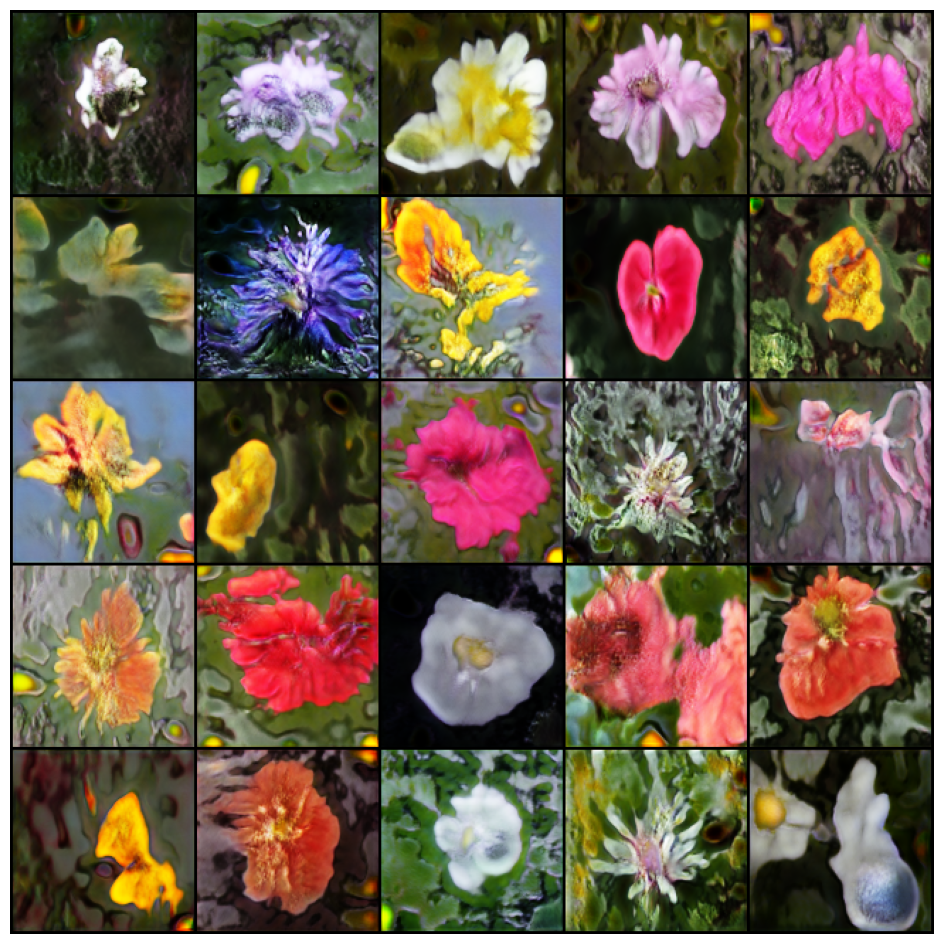

In [34]:
num_images = 25  # Number of images to generate

# Generate random noise vectors. The noise vector size must match the generator's expected input
noise = torch.randn(num_images, Z_DIM).to(DEVICE)

# Ensure the generator is in evaluation mode to disable dropout and batch normalization effects during inference
gen.eval()

# Generate images from the noise vectors without tracking gradients for efficiency
with torch.no_grad():
    fake_images = gen(noise, alpha, step)

# Display the generated images using the predefined show_tensor_images function
show_tensor_images(fake_images)

Image saved to truncated_images/output_truncation_0.0001_image.png


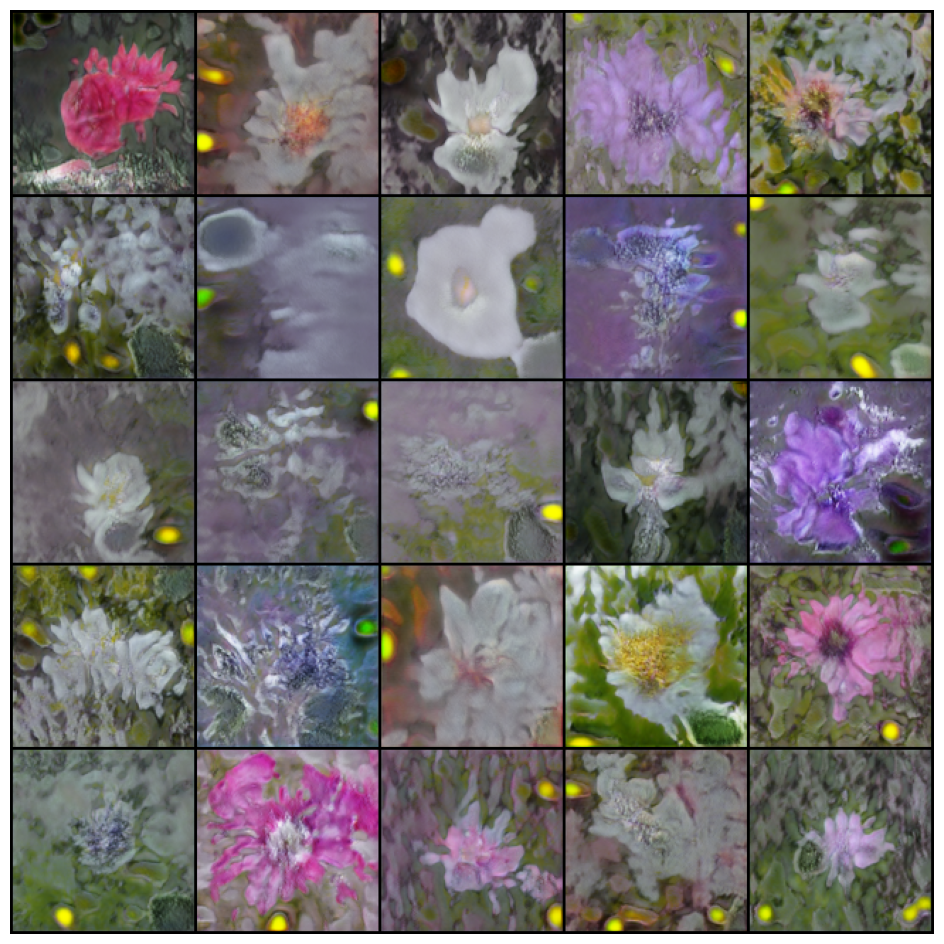

Image saved to truncated_images/output_truncation_0.5_image.png


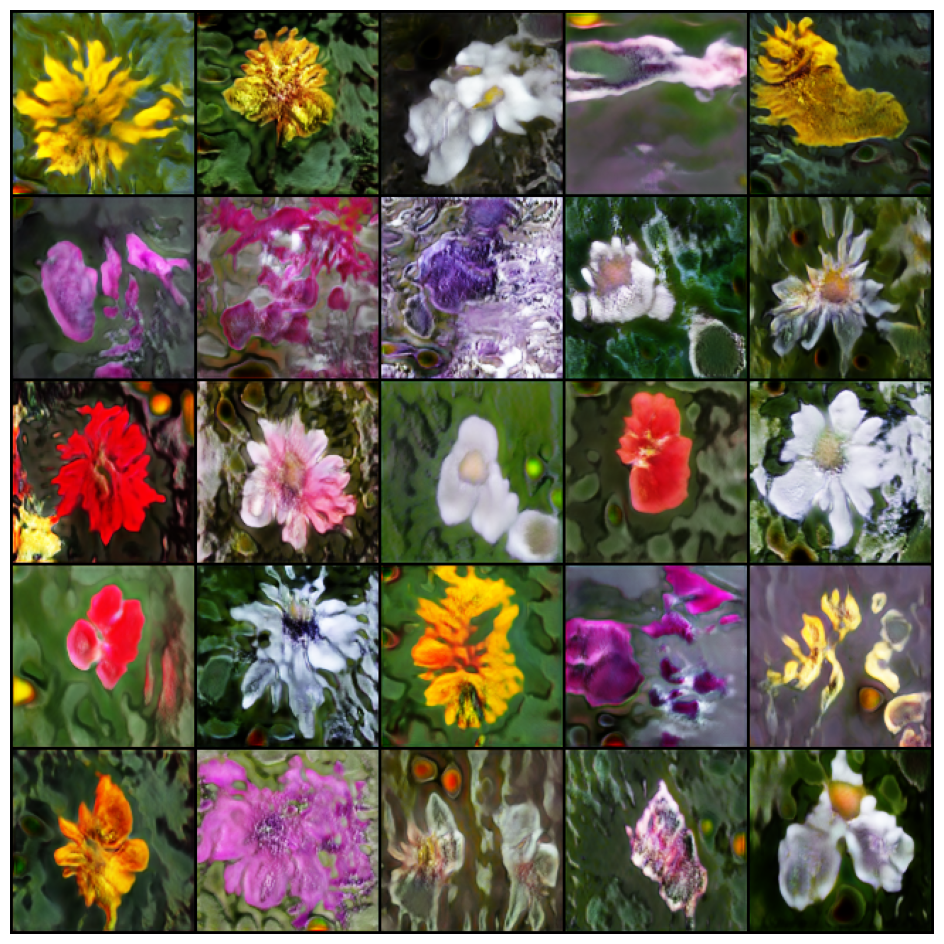

Image saved to truncated_images/output_truncation_1_image.png


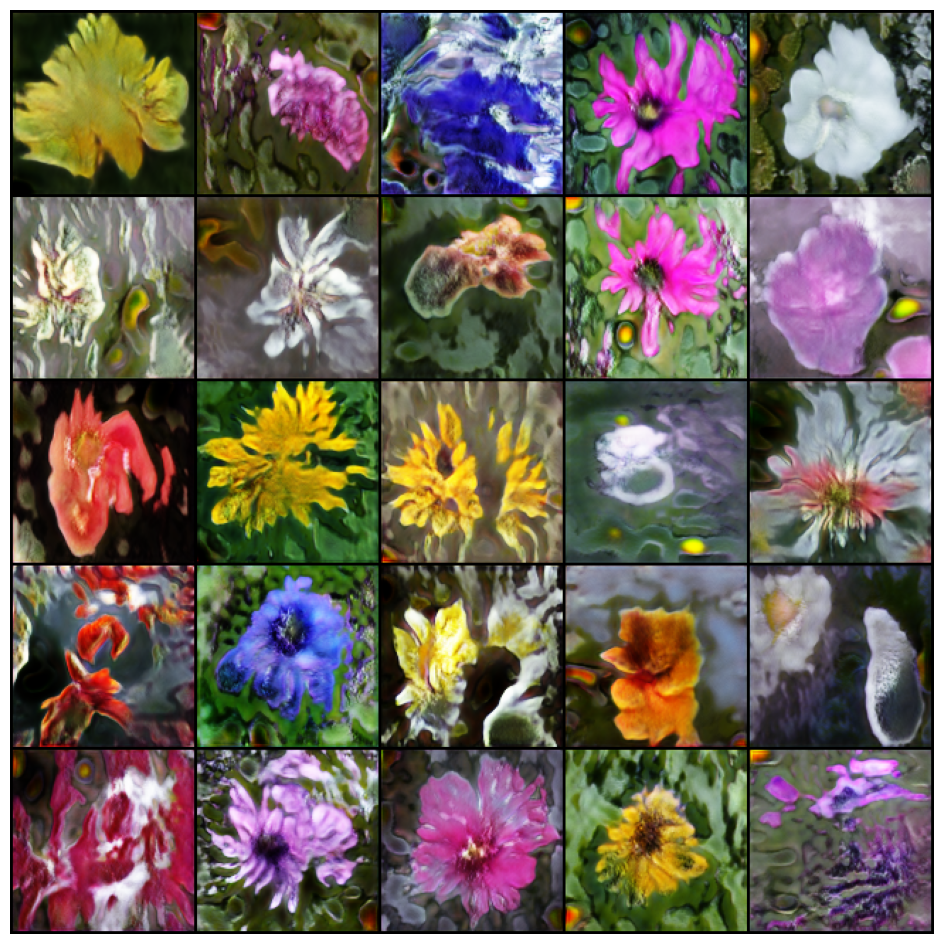

Image saved to truncated_images/output_truncation_2_image.png


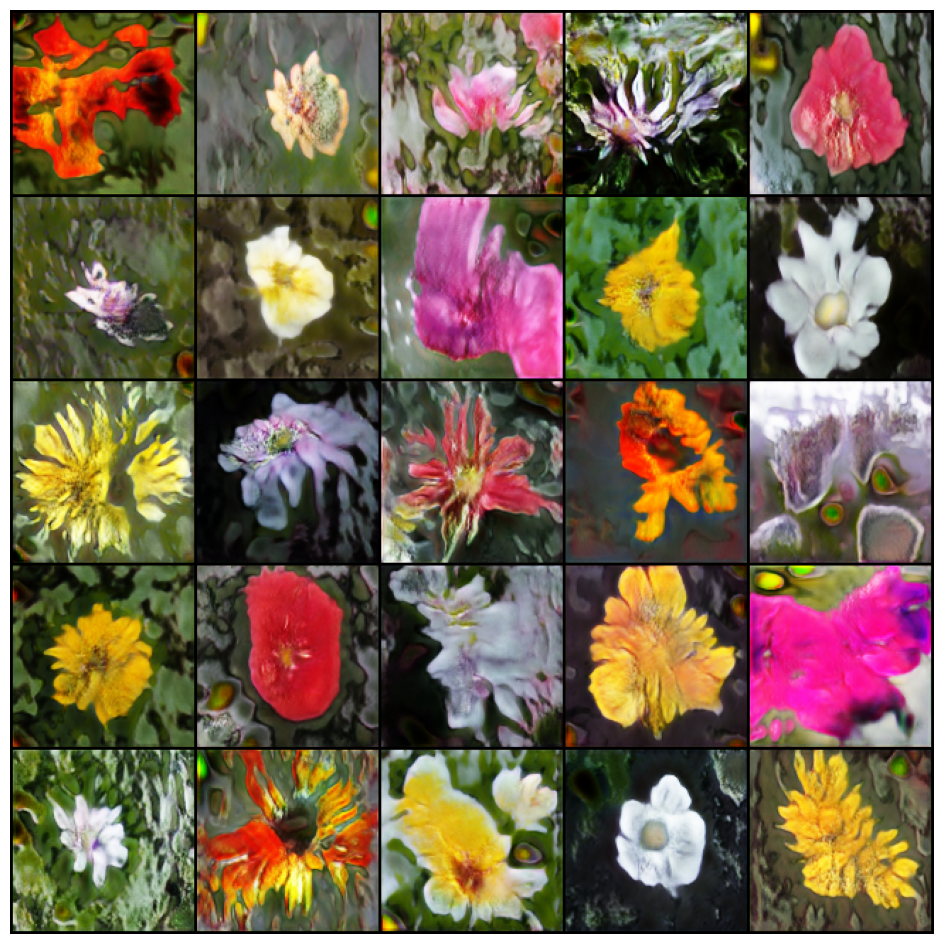

Image saved to truncated_images/output_truncation_5_image.png


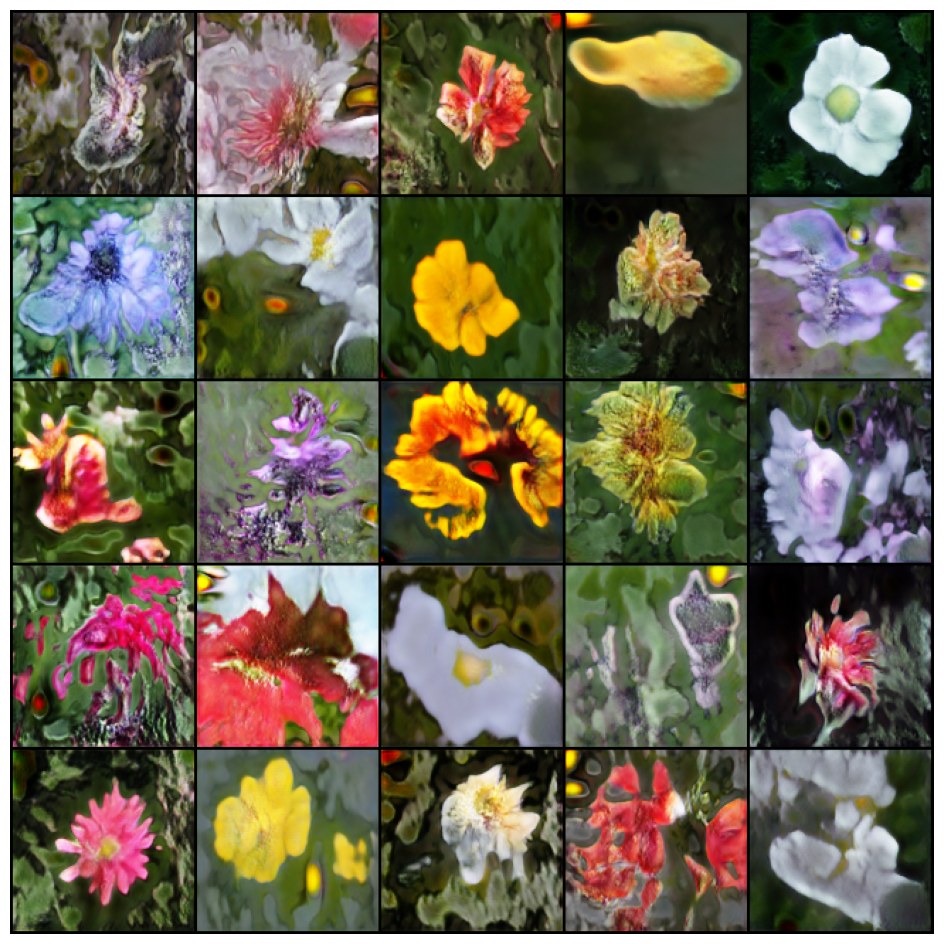

Image saved to truncated_images/output_truncation_10_image.png


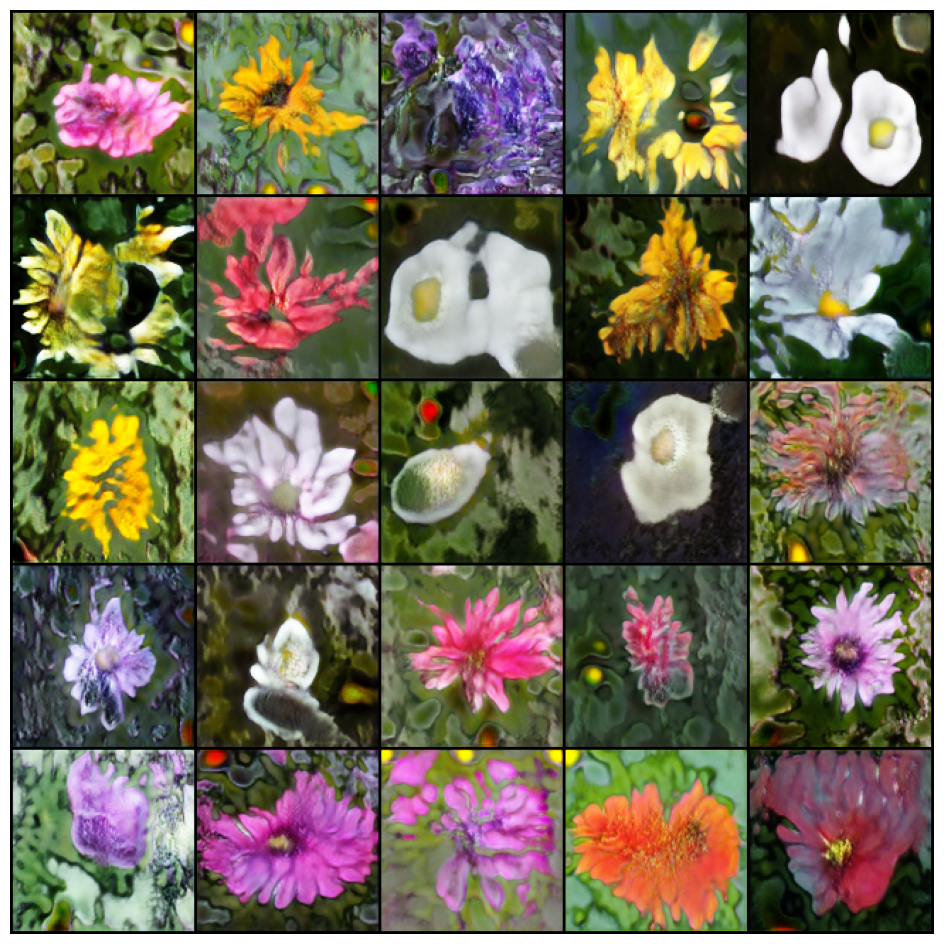

Image saved to truncated_images/output_truncation_20_image.png


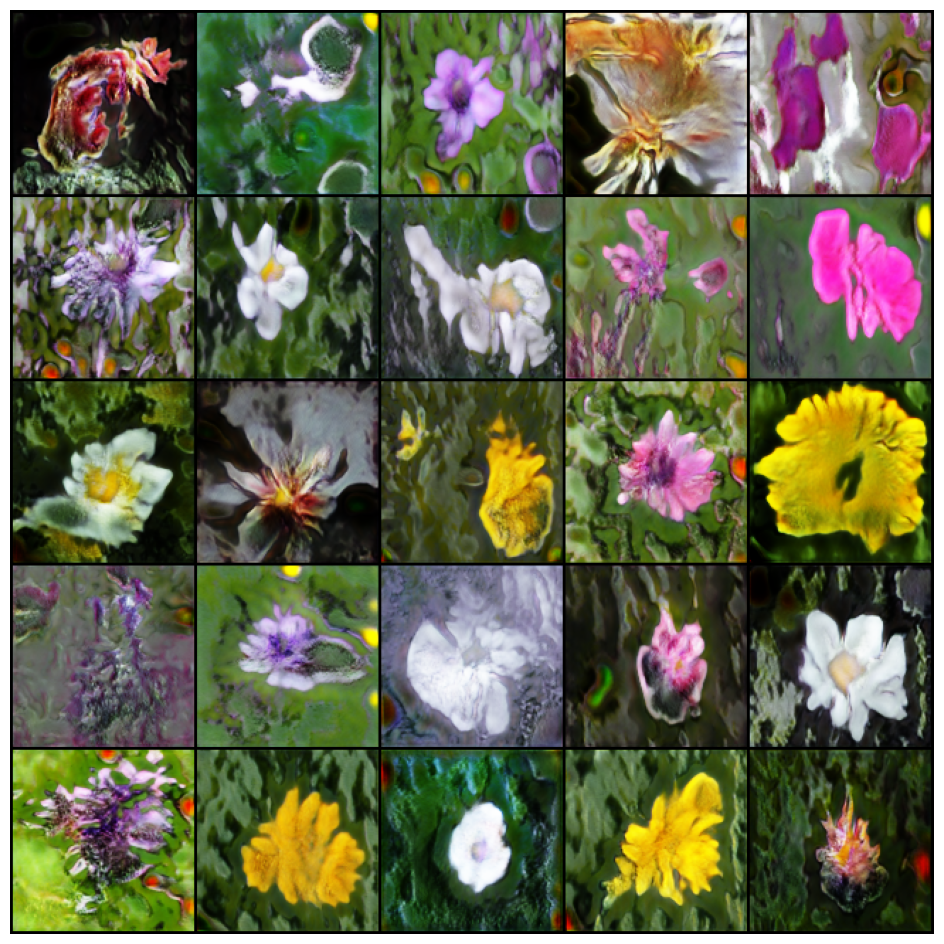

In [35]:
num_images = 25  # Number of images to generate

# Define a range of truncation values to test how they affect image generation
truncation_values = [1e-4, 0.5, 1, 2, 5, 10, 20]

# Create a directory to save output images if it doesn't already exist
output_dir = "truncated_images"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for truncation in truncation_values:
    # Generate noise with specified truncation
    trunc_noise = get_truncated_noise(num_images, Z_DIM, truncation, device=DEVICE)

    # Generate images using the noise
    with torch.no_grad():
        fake_images = gen(trunc_noise, alpha, step)
    
    # Construct a filename for each image based on its truncation value
    filename = os.path.join(output_dir, f"output_truncation_{truncation}_image.png")

    # Assuming show_tensor_images function can handle displaying and saving images
    show_tensor_images(fake_images, save_path=filename)

In [36]:
# Initialize the Inception v3 model without pre-trained weights
inception_model = inception_v3(pretrained=False)

# Load the pre-trained weights from a specified path
# This assumes that you have downloaded the model weights and saved them locally,
# which is common in environments where direct internet access is restricted.
weights_path = "/kaggle/input/inception-v3-pretrained-model/inception_v3_google-0cc3c7bd.pth"
inception_model.load_state_dict(torch.load(weights_path))

# Move the model to the appropriate device (GPU or CPU)
inception_model = inception_model.to(DEVICE)

# Set the model to evaluation mode
# This is important as models like Inception v3 may have layers such as batch normalization
# and dropout that behave differently during training and testing.
inception_model.eval()

# Replace the fully connected layer with an identity transformation.
# This modification is typically done when you are interested in using the model as a feature extractor,
# and you do not need the output class probabilities but rather the features from the penultimate layer.
inception_model.fc = torch.nn.Identity()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/opt/conda/lib/python3.10/site-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


In [37]:
def matrix_sqrt(x):
    '''
    Computes the square root of a square matrix. Given a matrix A, the function returns matrix B,
    where B*B = A. This is used in applications such as computing the Fréchet Inception Distance (FID)
    between feature distributions of real and generated images.

    Parameters:
        x (torch.Tensor): A torch.Tensor representing a square matrix. It must be a 2D tensor.

    Returns:
        torch.Tensor: A tensor of the same shape as 'x', representing the square root of the matrix 'x'.
    '''
    # Detach the tensor from the current graph and move it to CPU for compatibility with SciPy
    y = x.cpu().detach().numpy()

    # Compute the square root of the matrix using SciPy's sqrtm function, which handles both
    # real and complex eigenvalues, making it suitable for any square matrix provided.
    y_sqrt = scipy.linalg.sqrtm(y)

    # Since sqrtm can sometimes produce a complex matrix even for real matrices (due to numerical errors),
    # it's necessary to only take the real part of the matrix to ensure compatibility with most applications.
    if np.iscomplexobj(y_sqrt):
        y_sqrt = y_sqrt.real  # Discard the imaginary parts if present.

    # Convert the resulting real square root matrix back to a PyTorch tensor,
    # ensuring it's on the same device as the original input tensor for further computations.
    return torch.from_numpy(y_sqrt).to(x.device)

In [38]:
def frechet_distance(mu_x, mu_y, sigma_x, sigma_y):
    '''
    Calculates the Fréchet distance between two multivariate Gaussian distributions, parameterized
    by their means and covariance matrices. This distance metric is often used in the context of
    generative models, particularly to assess the quality of synthetic images relative to real images.

    Parameters:
        mu_x (torch.Tensor): The mean vector of the first Gaussian distribution, of shape (n_features,).
        mu_y (torch.Tensor): The mean vector of the second Gaussian distribution, of shape (n_features,).
        sigma_x (torch.Tensor): The covariance matrix of the first Gaussian distribution, 
                                of shape (n_features, n_features).
        sigma_y (torch.Tensor): The covariance matrix of the second Gaussian distribution,
                                of shape (n_features, n_features).

    Returns:
        torch.Tensor: A scalar tensor representing the Fréchet distance between the two distributions.
    '''

    # Calculate the squared Euclidean distance between the two mean vectors.
    # This represents the squared magnitude of the difference between the centers of the Gaussians.
    diff = mu_x - mu_y
    mean_diff_squared = torch.dot(diff, diff)  # dot product of the difference with itself

    # Compute the trace of the covariance matrices. The trace of a matrix is the sum of its diagonal elements
    # and represents the variance of the distribution along its dimensions.
    trace_x = torch.trace(sigma_x)
    trace_y = torch.trace(sigma_y)

    # Compute the square root of the product of the two covariance matrices.
    # This operation involves matrix multiplication followed by taking the square root of the resulting matrix,
    # which is needed to compute the similarity in the spread and orientation of the two distributions.
    product_sqrt = matrix_sqrt(torch.mm(sigma_x, sigma_y))
    trace_sqrt_product = torch.trace(product_sqrt)

    # Calculate the Fréchet distance using the formula for the distance between two Gaussians.
    # The formula includes the trace of the individual covariance matrices and the trace of the square root
    # of the product of the covariance matrices.
    return mean_diff_squared + trace_x + trace_y - 2 * trace_sqrt_product

In [39]:
def preprocess(img):
    """
    This function resizes a batch of images to a specified size using bilinear interpolation, preparing them
    for input into models like Inception v3 that require fixed-size inputs. Bilinear interpolation helps in
    maintaining the quality of the image during the resizing process.

    Parameters:
        img (torch.Tensor): A 4D tensor of shape (N, C, H, W), where
                            N is the number of images (batch size),
                            C is the number of color channels (e.g., 3 for RGB),
                            H is the height of the images,
                            W is the width of the images.

    Returns:
        torch.Tensor: A tensor containing the resized images, maintaining the batch size and channel dimensions
                      but with height and width adjusted to 299 x 299.

    Raises:
        ValueError: If the input is not a 4D tensor, a ValueError is raised with a message explaining that
                    the function expects a batch of images in the correct format.
    """
    # Ensure the input image tensor is in the correct 4D format (batch size, channels, height, width)
    if img.dim() != 4:
        raise ValueError("Expected input tensor to be a 4D (batch, channels, height, width)")

    # Use bilinear interpolation for resizing the image
    # This method considers the closest 2x2 neighborhood of known pixel values surrounding the unknown pixel's
    # computed location and derives a value from these to get the best estimate for the pixel's actual value.
    img = torch.nn.functional.interpolate(img, size=(299, 299), mode='bilinear', align_corners=False)

    return img

In [40]:
def get_covariance(features):
    """
    Computes the covariance matrix from a batch of features. This matrix describes the variance of
    each feature and the covariances between features.

    Parameters:
        features (torch.Tensor): A 2D tensor where each row represents an observation (data point)
                                 and each column represents a feature.

    Returns:
        torch.Tensor: A 2D tensor representing the covariance matrix of the input features. The shape
                      of the output matrix is (n_features, n_features), where n_features is the number
                      of features.

    Notes:
        The function uses 'rowvar=False' to treat rows as observations and columns as variables (features),
        which aligns with common statistical practices where each feature is a variable and each observation
        is an independent sample.
    """
    # Detach the tensor from any previous computation graph and convert it to a NumPy array
    # This conversion is necessary because numpy.cov does not directly support PyTorch tensors
    features_np = features.detach().numpy()

    # Calculate the covariance matrix using numpy's cov function, which computes covariance between pairs of features
    covariance_matrix = np.cov(features_np, rowvar=False)

    # Convert the resulting numpy array back to a torch.Tensor to maintain consistency with PyTorch workflows
    return torch.Tensor(covariance_matrix)

In [47]:
# Model setup
gen.eval()  # Set the generator to evaluation mode

# Define sample size parameter
n_samples = 8000  # Total number of samples to evaluate

# Initialize lists to store features for real and generated images
fake_features_list = []
real_features_list = []

cur_samples = 0
with torch.no_grad():  # Context manager that disables gradient calculation
    try:
        # Iterate over the dataset
        for real_example, _ in tqdm(dataloader, total=n_samples // 4):
            real_samples = real_example
            # Process real images through the Inception model and collect features
            real_features = inception_model(real_samples.to(DEVICE)).detach().to('cpu')  # Detach from GPU and move to CPU
            real_features_list.append(real_features)

            # Generate fake images from noise, preprocess them, and collect features
            fake_samples = torch.randn(len(real_example), Z_DIM).to(DEVICE)
            fake_images = gen(fake_samples, alpha, step) # Generate and preprocess fake images
            fake_images = preprocess(fake_images)  # Apply preprocessing defined above
            fake_features = inception_model(fake_images.to(DEVICE)).detach().to('cpu')  # Detach from GPU and move to CPU
            fake_features_list.append(fake_features)

            cur_samples += len(real_samples)
            if cur_samples >= n_samples:  # Stop once the specified number of samples is reached
                break
    except Exception as e:
        print(f"Error in loop: {str(e)}")  # Print any errors that occur during the feature extraction loop

# Concatenate all feature tensors to form a single tensor for real and fake features
fake_features_all = torch.cat(fake_features_list)
real_features_all = torch.cat(real_features_list)

# Calculate the mean of the features from the real and fake samples
mu_fake = fake_features_all.mean(0)
mu_real = real_features_all.mean(0)

# Calculate the covariance matrices of the real and fake features
sigma_fake = get_covariance(fake_features_all)
sigma_real = get_covariance(real_features_all)

100%|█████████▉| 1999/2000 [03:27<00:00,  9.62it/s]


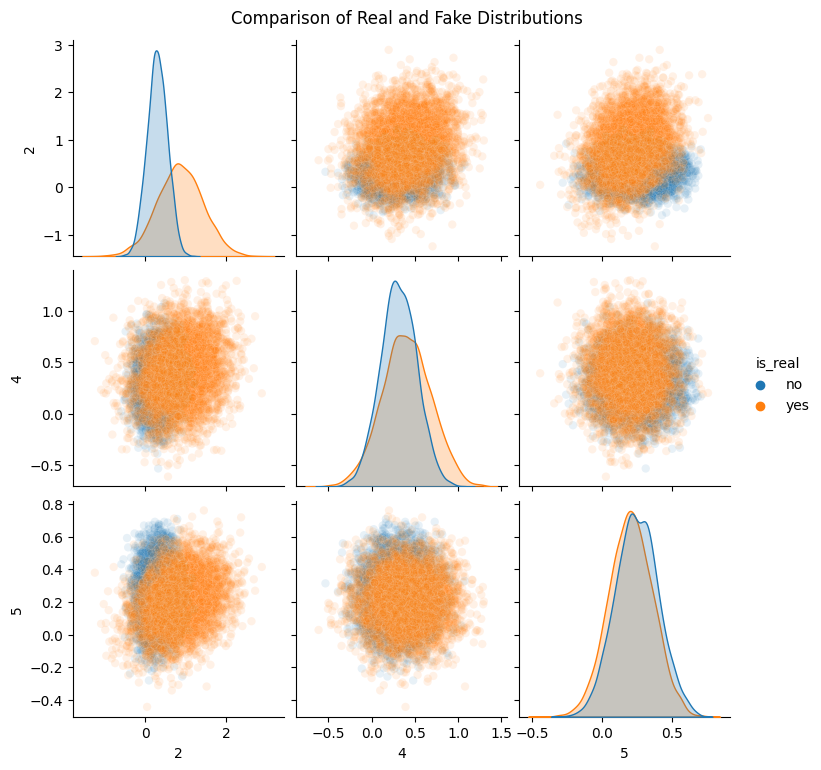

In [48]:
# Suppress specific FutureWarnings from seaborn and pandas to maintain clean output
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")
warnings.filterwarnings("ignore", category=FutureWarning, module="pandas.core.common")

# Define indices for the selected features to be analyzed
indices = [2, 4, 5]

# Create multivariate normal distributions for the selected real and fake feature subsets
# These distributions are based on the means and covariance matrices sliced according to the chosen indices
fake_dist = MultivariateNormal(mu_fake[indices], sigma_fake[indices][:, indices])
real_dist = MultivariateNormal(mu_real[indices], sigma_real[indices][:, indices])

# Sample data from the distributions
# Sampling 5000 points to ensure sufficient data for a smooth distribution representation
fake_samples = fake_dist.sample((5000,))
real_samples = real_dist.sample((5000,))

# Convert the samples into Pandas DataFrames for easier manipulation and visualization
# Each column in the DataFrame corresponds to one of the selected indices/features
df_fake = pd.DataFrame(fake_samples.numpy(), columns=[str(i) for i in indices])
df_real = pd.DataFrame(real_samples.numpy(), columns=[str(i) for i in indices])
df_fake["is_real"] = "no"  # Label fake samples
df_real["is_real"] = "yes"  # Label real samples

# Concatenate the fake and real dataframes to facilitate combined visualization
df = pd.concat([df_fake, df_real])

# Use seaborn to create pair plots of the distributions of selected features
# 'hue' parameter uses the 'is_real' column to color points by whether they are from real or fake distributions
g = sns.pairplot(df, plot_kws={'alpha': 0.1}, hue='is_real')

# Enhance the plot with a title and ensure it does not overlap with other elements
g.fig.suptitle("Comparison of Real and Fake Distributions", y=1.02)

# Save the generated plot to a file
plt.savefig("real_vs_fake_distribution_comparison.png")
plt.show()
plt.close(g.fig)  # Close the plot figure to free up memory

In [49]:
# Use a context manager to temporarily set all the required gradients to zero, optimizing memory usage and computation
with torch.no_grad():
    # Compute the Fréchet Distance between the real and fake data distributions
    # The Fréchet Distance is calculated using the means and covariance matrices of the Inception features
    # extracted from the real and generated images.
    # This is a crucial metric in evaluating GAN performance, as it compares how similar the generated images are
    # to the real images in terms of content and style captured by the deep features.
    fid_score = frechet_distance(mu_real, mu_fake, sigma_real, sigma_fake).item()

# Output the calculated Fréchet Inception Distance score
print("Fréchet Distance (FID) Score:", fid_score)

Fréchet Distance (FID) Score: 139.05137634277344


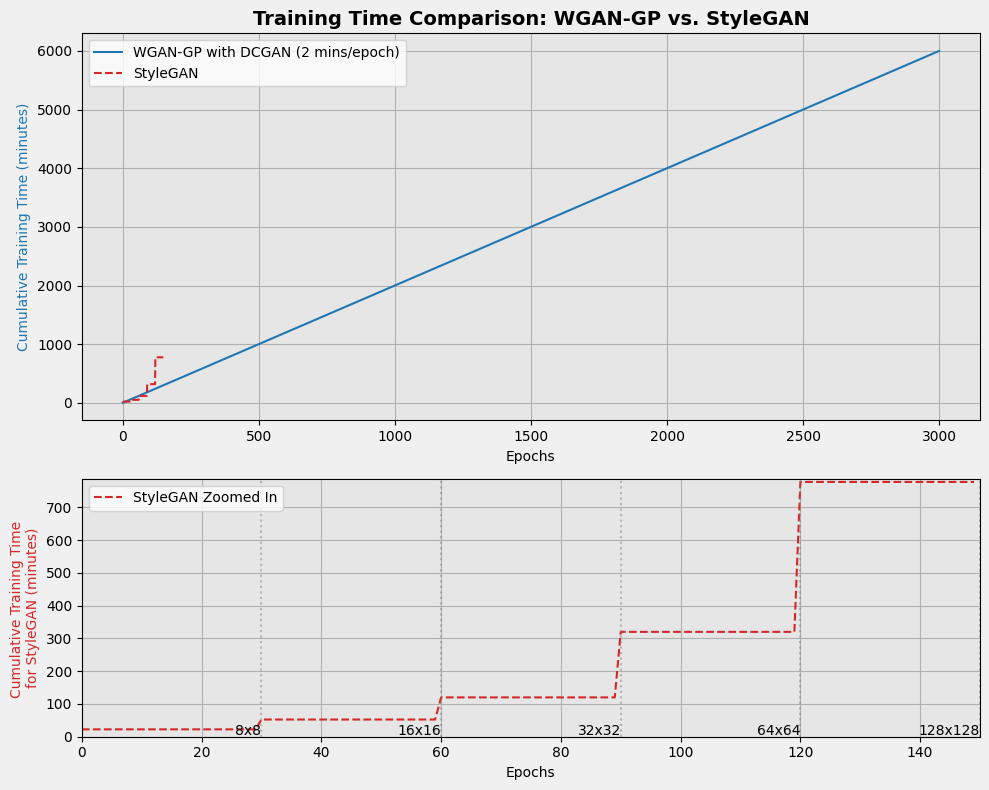

In [50]:
# Data for WGAN-GP
epochs_wgan = 3000
time_per_epoch_wgan = 2  # minutes per epoch
total_time_wgan = [time_per_epoch_wgan * epoch for epoch in range(1, epochs_wgan + 1)]

# Data for StyleGAN
epochs_per_resolution = 30
times_stylegan = [45/60, 1, 2 + 15/60, 6 + 40/60, 15 + 15/60]  # Times in minutes
resolutions = [8, 16, 32, 64, 128]

# Cumulative time calculation for StyleGAN
cumulative_times_stylegan = []
current_time = 0
for time in times_stylegan:
    current_time += time * epochs_per_resolution
    cumulative_times_stylegan.extend([current_time] * epochs_per_resolution)

# Setup plots with subplots and adjust the height ratios to make the first plot smaller.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [1.5, 1]})

# Custom background color
fig.patch.set_facecolor('#f0f0f0')
ax1.set_facecolor('#e6e6e6')
ax2.set_facecolor('#e6e6e6')

# Plot WGAN-GP and StyleGAN on the first axis
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Cumulative Training Time (minutes)', color='tab:blue')
ax1.plot(total_time_wgan, label='WGAN-GP with DCGAN (2 mins/epoch)', color='tab:blue')
ax1.plot(cumulative_times_stylegan, label='StyleGAN', color='tab:red', linestyle='--')
ax1.legend(loc='upper left')
ax1.grid(True)

# Enhanced title settings
ax1.title.set_text('Training Time Comparison: WGAN-GP vs. StyleGAN')
ax1.title.set_fontsize(14)  # Increase font size
ax1.title.set_fontweight('bold')  # Make font bold

# Zoomed in view for StyleGAN on the second axis
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Cumulative Training Time \nfor StyleGAN (minutes)', color='tab:red')
ax2.plot(cumulative_times_stylegan, label='StyleGAN Zoomed In', color='tab:red', linestyle='--')
ax2.set_xlim(0, len(cumulative_times_stylegan))
ax2.set_ylim(0, max(cumulative_times_stylegan) + 10)
ax2.legend(loc='upper left')
ax2.grid(True)

# Adding resolution change markers and labels in the zoomed plot
for i, res in enumerate(resolutions):
    ax2.axvline(x=epochs_per_resolution * (i + 1), color='grey', linestyle=':', alpha=0.5)
    ax2.text(epochs_per_resolution * (i + 1), max(cumulative_times_stylegan) * 0.05, f'{res}x{res}',
             horizontalalignment='right', verticalalignment='top')

fig.tight_layout()  # Adjust layout
plt.show()

# Save the figure
fig.savefig('Training_Time_Comparison.png', dpi=300, bbox_inches='tight')